### Импорт необходимых библиотек и настройка графического стиля

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
mpl.style.use(['Solarize_Light2'])

### Загрузка датасета и его чтение

In [3]:
from google.colab import files
uploaded = files.upload()

Saving Airbnb_Open_Data.csv to Airbnb_Open_Data.csv


In [4]:
data = pd.read_csv('Airbnb_Open_Data.csv', low_memory = False)

### Датафрейм: определение размера и основных характеристик

In [5]:
data.shape

(102599, 26)

В датафрейме 102599 строк и 26 колонок.

In [6]:
# Перевожу названия полей в общепринятый формат правописания
data.columns=[col.lower().replace(" ","_") for col in data.columns]
print(*data.columns, sep = '\n')

id
name
host_id
host_identity_verified
host_name
neighbourhood_group
neighbourhood
lat
long
country
country_code
instant_bookable
cancellation_policy
room_type
construction_year
price
service_fee
minimum_nights
number_of_reviews
last_review
reviews_per_month
review_rate_number
calculated_host_listings_count
availability_365
house_rules
license


In [7]:
data.describe().round(3)

,id,host_id,lat,long,construction_year,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
count,1.025990e+05,1.025990e+05,102591.000,102591.000,102385.000,102190.000,102416.000,86720.000,102273.000,102280.000,102151.000
mean,2.914623e+07,4.925411e+10,40.728,-73.950,2012.487,8.136,27.484,1.374,3.279,7.937,141.133
std,1.625751e+07,2.853900e+10,0.056,0.050,5.766,30.554,49.509,1.747,1.285,32.219,135.435
min,1.001254e+06,1.236005e+08,40.500,-74.250,2003.000,-1223.000,0.000,0.010,1.000,1.000,-10.000
25%,1.508581e+07,2.458333e+10,40.689,-73.983,2007.000,2.000,1.000,0.220,2.000,1.000,3.000
50%,2.913660e+07,4.911774e+10,40.722,-73.954,2012.000,3.000,7.000,0.740,3.000,1.000,96.000
75%,4.320120e+07,7.399650e+10,40.763,-73.932,2017.000,5.000,30.000,2.000,4.000,2.000,269.000
max,5.736742e+07,9.876313e+10,40.917,-73.705,2022.000,5645.000,1024.000,90.000,5.000,332.000,3677.000


In [8]:
data['country'].value_counts()

United States    102067
Name: country, dtype: int64

In [9]:
data['country_code'].value_counts()

US    102468
Name: country_code, dtype: int64

In [10]:
#В столбцах 'country' и 'country_code' значения не меняются, столбцы можно удалить
data = data.drop(columns = ['country','country_code'], axis = 1)

### Пропущенные значения: их количество и процент. Составление тепловой карты.



In [11]:
table = pd.DataFrame({
    'Type': data.dtypes,
    'NUnique': data.nunique(),
    'Null_quantity': data.isna().sum(),
    'Null_percent': round((data.isnull().sum() / len(data) *100), 3)
})
display(table)

,Type,NUnique,Null_quantity,Null_percent
id,int64,102058,0,0.000
name,object,61281,250,0.244
host_id,int64,102057,0,0.000
host_identity_verified,object,2,289,0.282
host_name,object,13190,406,0.396
neighbourhood_group,object,7,29,0.028
neighbourhood,object,224,16,0.016
lat,float64,21991,8,0.008
long,float64,17774,8,0.008
instant_bookable,object,2,105,0.102


Количество пропущенных значений: 190106
Процент пропущенных значений: 7.72 %


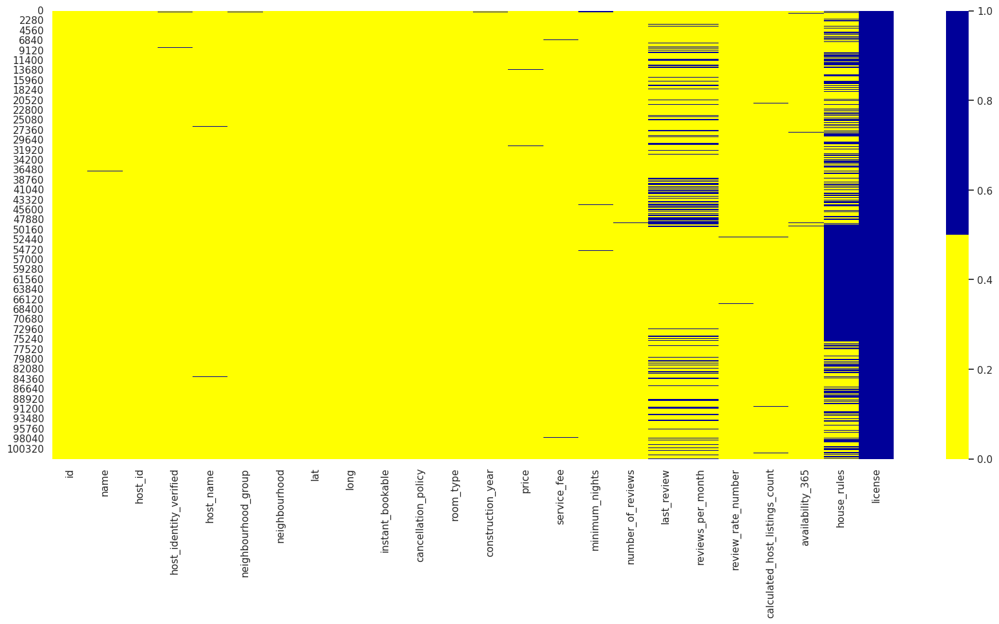

In [12]:
sns.set (rc = {'figure.figsize' : (21,9)})
cols = data.columns
colors = ['#ffff00', '#000099' ]
sns.heatmap(data[cols].isnull(), cmap = sns.color_palette(colors))
print(f'Количество пропущенных значений: {data.isnull().sum().sum()}')
print(f'Процент пропущенных значений: {round((data.isnull().sum().sum() / data.size) * 100, 3)} %')
#ffff00 - желтый цвет (значение есть), #000099 - синий цвет (значения нет)

В полях house_rules и licence очень много пропущенных значений, эти поля можно удалить полностью.

In [13]:
data = data.drop(columns = ['house_rules', 'license'], axis = 1)

### Преобразование типов данных в датафрейме

In [14]:
data['last_review'] = pd.to_datetime(data['last_review'])
#Поле Последний просмотр  - в формат datetime
data['price'] = data['price'].str.replace(r'\D+', '', regex = True).astype('float64')
data['service_fee'] = data['service_fee'].str.replace(r'\D+', '', regex = True).astype('float64')
#Поле Цена и Плата за обслуживание - регулярным выражением отсекаю все нецифровые символы и перевожу в формат float64

data = data.astype(
    {
      'name': 'str',
      'host_identity_verified': 'str',
      'host_name': 'str',
      'neighbourhood_group': 'str',
      'neighbourhood': 'str',
      'instant_bookable': 'str',
      'cancellation_policy': 'str',
      'room_type': 'str'
    }
)

### Поиск и удаление дубликатов

In [15]:
# Поиск дубликатов и подсчет их количества
data.duplicated().value_counts()

False    102058
True        541
dtype: int64

In [16]:
# Удаление дубликатов
data.drop_duplicates(inplace = True)

### Проверка значений датасета на логические ошибки.

Значения в поле minimum nights не могут быть меньше 1. Бронирование возможно на срок от 1 до 365 дней. Проверю это.

In [17]:
data.groupby('minimum_nights').count()

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,room_type,construction_year,price,service_fee,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
minimum_nights,,,,,,,,,,,,,,,,,,,,,
-1223.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,0,0,1,1,1
-365.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
-200.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
-125.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
-12.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000.0,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,0,0,2,2,2
1250.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2645.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [18]:
# Удаляю строки с ошибками
data = data[(data['minimum_nights'] >= 1) & (data['minimum_nights'] <= 365)]

Значения в поле availability 365 не могут быть меньше 1, и лежат в диапазоне от 1 до 365 включительно.

In [19]:
data.groupby('availability_365').count()

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count
availability_365,,,,,,,,,,,,,,,,,,,,,
-10.0,36,36,36,36,36,36,36,36,36,36,...,36,36,36,35,36,36,32,32,36,36
-9.0,46,46,46,46,46,46,46,46,46,46,...,46,45,46,46,46,46,39,39,46,46
-8.0,50,50,50,50,50,50,50,50,50,50,...,50,49,50,50,50,50,38,38,50,50
-7.0,36,36,36,36,36,36,36,36,36,36,...,36,36,36,36,36,36,27,27,36,36
-6.0,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,25,25,30,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423.0,48,48,48,48,48,48,48,48,48,48,...,48,47,48,47,48,48,41,41,48,46
424.0,38,38,38,38,38,38,38,38,38,38,...,38,38,36,38,38,38,31,31,38,38
425.0,49,49,49,49,49,49,49,49,49,49,...,49,49,49,49,49,49,41,41,49,48


In [20]:
# Удаляю строки с ошибками
data = data[(data['availability_365'] >= 1) & (data['availability_365'] <= 365)]

Исправляю опечатки в значениях поля Городской округ ('neighbourhood group')

In [21]:
data.groupby('neighbourhood_group').count()

,id,name,host_id,host_identity_verified,host_name,neighbourhood,lat,long,instant_bookable,cancellation_policy,...,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,,,,,,,,,,,,
Bronx,2328,2328,2328,2328,2328,2328,2328,2328,2328,2328,...,2325,2321,2325,2328,2328,2075,2075,2312,2324,2328
Brooklyn,29323,29323,29323,29323,29323,29323,29320,29320,29323,29323,...,29258,29257,29239,29323,29292,26095,26091,29252,29229,29323
Manhattan,31529,31529,31529,31529,31529,31529,31525,31525,31529,31529,...,31464,31455,31456,31529,31476,26478,26478,31424,31436,31529
Queens,10576,10576,10576,10576,10576,10576,10575,10575,10576,10576,...,10566,10554,10556,10576,10561,9473,9474,10542,10551,10576
Staten Island,843,843,843,843,843,843,843,843,843,843,...,842,841,840,843,843,765,765,839,841,843
brookln,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
manhatan,1,1,1,1,1,1,1,1,1,1,...,1,1,0,1,1,1,1,1,1,1
nan,15,15,15,15,15,15,15,15,15,15,...,12,14,15,15,15,13,13,13,15,15


In [22]:
data.loc[data['neighbourhood_group'] == 'brookln', 'neighbourhood_group'] = 'Brooklyn'
data.loc[data['neighbourhood_group'] == 'manhatan', 'neighbourhood_group'] = 'Manhattan'
data.loc[data['neighbourhood_group'] == 'nan', 'neighbourhood_group'] = 'Others'

### График распределения денежной емкости рынка по Городским округам

In [23]:
market_volume = data['price'].groupby(data['neighbourhood_group']).agg(volume = 'sum').sort_values(by = 'volume', ascending = False)

In [24]:
# Емкость рынка в денежных единицах
market_volume

,volume
neighbourhood_group,
Manhattan,19593565.0
Brooklyn,18342634.0
Queens,6629868.0
Bronx,1459716.0
Staten Island,520732.0
Others,11490.0


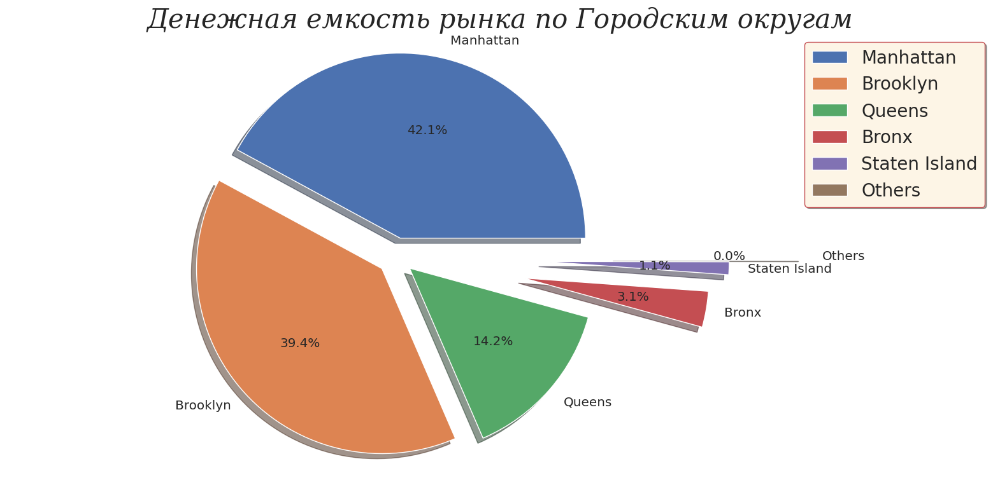

In [25]:
plt.figure(figsize=(20,9))
plt.title('Денежная емкость рынка по Городским округам', 
          fontsize = 30, 
          fontfamily = 'serif', 
          fontstyle = 'italic')
labels = list(market_volume.index)
explode = (0.1, 0.1, 0.1, 0.7, 0.8, 1.2)
plt.pie(list(market_volume.loc[:, 'volume']), 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', 
        textprops={'size': 'large'}, 
        shadow=True, 
        startangle=0)
plt.axis('equal')
plt.legend(shadow = True, 
          fontsize = 20, 
          ncol = 1,
          facecolor = 'oldlace',
          edgecolor = 'r')
plt.show()

### График распределения денежной емкости рынка по Типу помещения

In [26]:
room_type = data['price'].groupby(data['room_type']).agg(volume = 'sum').sort_values(by = 'volume', ascending = False)

In [27]:
room_type

,volume
room_type,
Entire home/apt,25006838.0
Private room,20426154.0
Shared room,1061574.0
Hotel room,63439.0


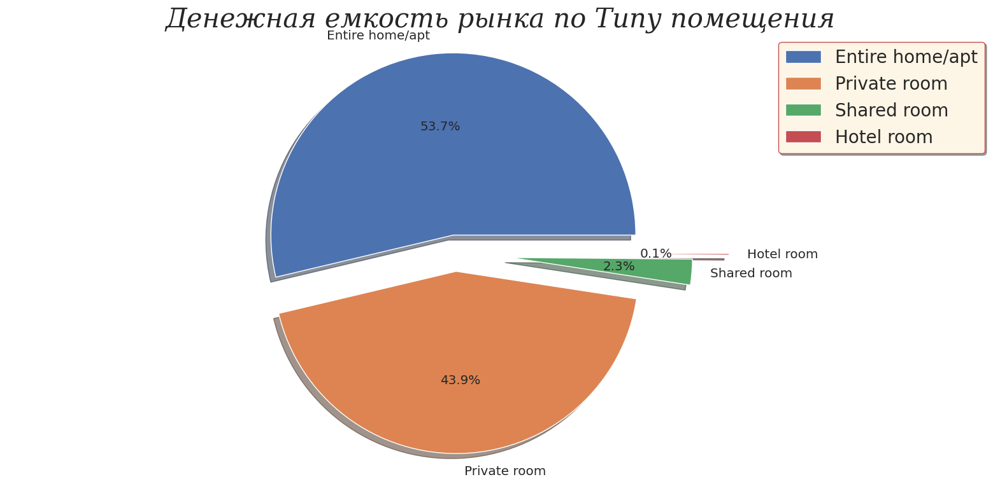

In [28]:
plt.figure(figsize=(20,9))
plt.title('Денежная емкость рынка по Типу помещения', 
          fontsize = 30, 
          fontfamily = 'serif', 
          fontstyle = 'italic')
labels = list(room_type.index)
explode = (0.1, 0.1, 0.3, 0.5)
plt.pie(list(room_type.loc[:, 'volume']), 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', 
        textprops={'size': 'large'}, 
        shadow=True, 
        startangle=0)
plt.axis('equal')
plt.legend(shadow = True, 
          fontsize = 20, 
          ncol = 1,
          facecolor = 'oldlace',
          edgecolor = 'r')
plt.show()

### График цены объекта аренды по Районам

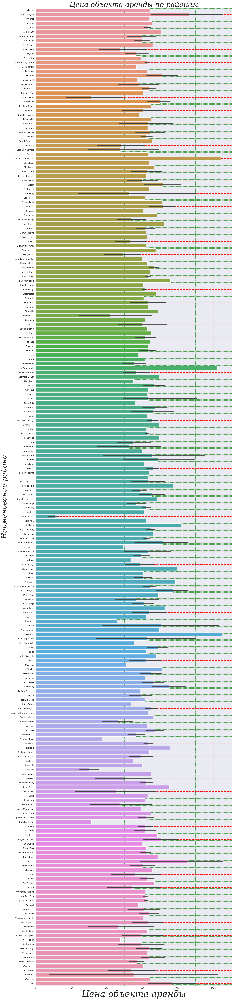

In [29]:
plt.figure(figsize = (20,100))
order = data.sort_values('neighbourhood')['neighbourhood'].unique()
sns.barplot(data=data, x='price', y='neighbourhood', order=order)
plt.title('Цена объекта аренды по районам', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.xlabel('Цена объекта аренды', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 50)
plt.ylabel('Наименование района', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.minorticks_on()
plt.grid(which = 'major', color = 'red', linewidth = 0.8, linestyle = '--')
plt.grid(which = 'minor', color = 'green', linewidth = 0.5, linestyle = '--')
plt.legend()
plt.show()

### График распределения денежной емкости рынка по Районам

In [30]:
neighbourhood = data['price'].groupby(data['neighbourhood']).agg(volume = 'sum').sort_values(by = 'volume', ascending = False)

In [31]:
neighbourhood

,volume
neighbourhood,
Bedford-Stuyvesant,3617686.0
Williamsburg,3089770.0
Harlem,2440657.0
Bushwick,2077630.0
Hell's Kitchen,1961178.0
...,...
Glen Oaks,1101.0
New Dorp,1048.0
"Chelsea, Staten Island",1042.0


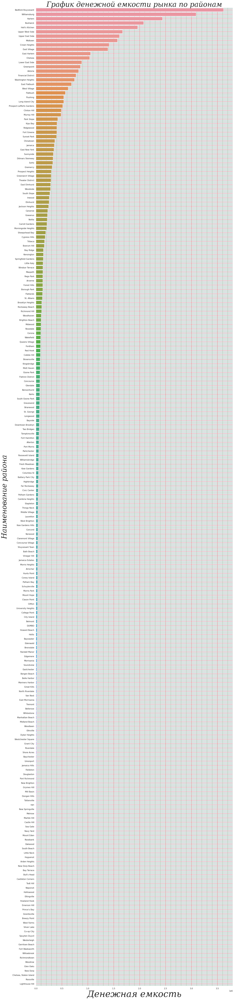

In [32]:
plt.figure(figsize = (20,100))
sns.barplot(data=neighbourhood, x='volume', y=neighbourhood.index, order=neighbourhood.index)
plt.title('График денежной емкости рынка по районам', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.xlabel('Денежная емкость', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 50)
plt.ylabel('Наименование района', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.minorticks_on()
plt.grid(which = 'major', color = 'red', linewidth = 0.8, linestyle = '--')
plt.grid(which = 'minor', color = 'green', linewidth = 0.5, linestyle = '--')
plt.show()

### Построение матрицы корреляции

<Axes: >

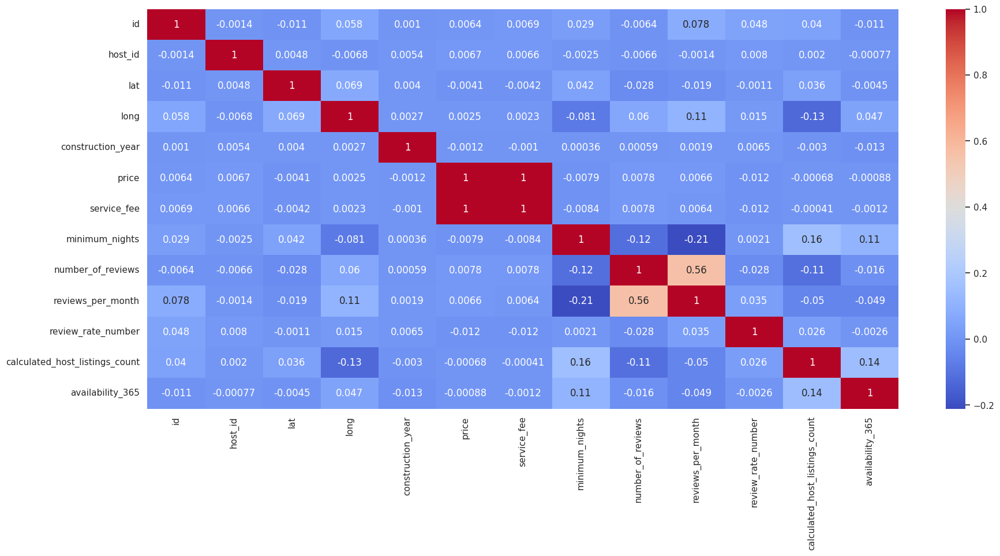

In [33]:
corr_matrix = data.corr(numeric_only = True)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

### Диаграмма рассеяния количества отзывов.

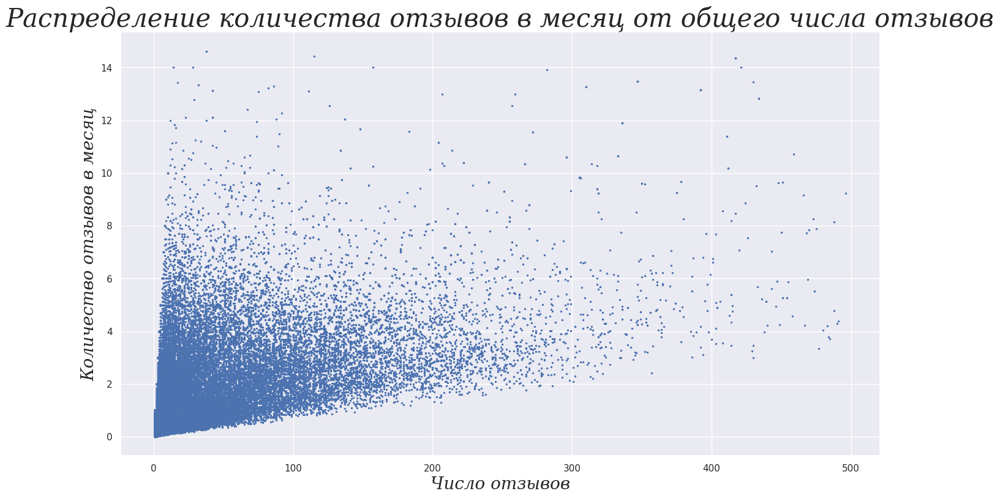

In [34]:
plt.figure(figsize = (16, 9))
part_of_the_values = data[(data['number_of_reviews'] <= 500) & (data['reviews_per_month'] <= 15)]
#Обрезал исходные данные, чтобы не показывать на графике возможные выбросы
plt.scatter(part_of_the_values['number_of_reviews'], part_of_the_values['reviews_per_month'], s = 2)
plt.title('Распределение количества отзывов в месяц от общего числа отзывов', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 30)
plt.xlabel('Число отзывов', fontfamily = 'serif',
                fontstyle = 'italic', fontsize = 20)
plt.ylabel('Количество отзывов в месяц', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 20)
plt.show()

### Зависимость размера комиссии от цены за квартиру

In [35]:
# Новое поле, где в процентах указан размер сервисного сбора
data['comission'] = round((data['service_fee']/data['price'])*100, 3)

In [36]:
data.groupby('neighbourhood_group').agg({'comission':['min', 'median', 'max']})

comission               
                          min median     max
neighbourhood_group                         
Bronx                  19.231   20.0  20.690
Brooklyn               19.231   20.0  20.755
Manhattan              19.231   20.0  20.755
Others                 19.841   20.0  20.039
Queens                 19.231   20.0  20.755
Staten Island          19.298   20.0  20.513

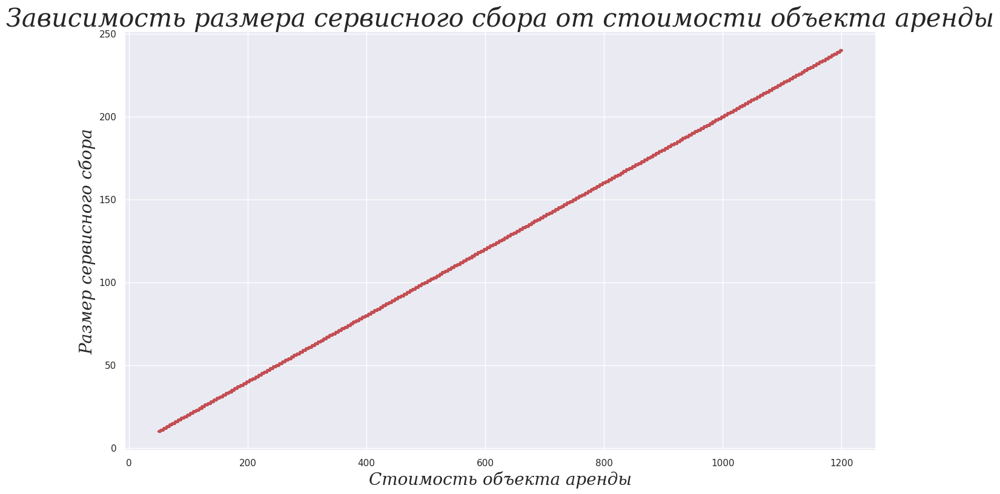

In [37]:
plt.figure(figsize = (16, 9))
plt.scatter(data['price'], data['service_fee'], s = 2, color = 'r')
plt.title('Зависимость размера сервисного сбора от стоимости объекта аренды', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 30)
plt.xlabel('Стоимость объекта аренды', fontfamily = 'serif',
                fontstyle = 'italic', fontsize = 20)
plt.ylabel('Размер сервисного сбора', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 20)
plt.show()

### График интенсивности просмотров объектов по Районам

In [38]:
views = data.groupby('neighbourhood')['number_of_reviews'].agg(volume = 'sum').sort_values(by = 'volume', ascending = False)

In [39]:
views

,volume
neighbourhood,
Bedford-Stuyvesant,236442.0
Williamsburg,160078.0
Harlem,151776.0
Bushwick,105481.0
Hell's Kitchen,96378.0
...,...
Bull's Head,29.0
Breezy Point,28.0
Woodrow,21.0


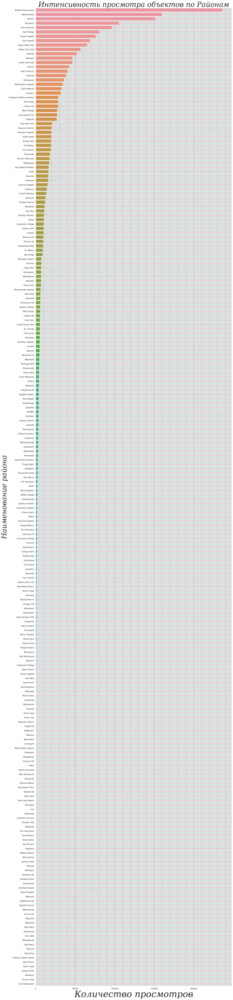

In [40]:
plt.figure(figsize = (20,100))
sns.barplot(data=views, x='volume', y=views.index, order=views.index)
plt.title('Интенсивность просмотра объектов по Районам', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.xlabel('Количество просмотров', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 50)
plt.ylabel('Наименование района', fontfamily = 'serif',
                fontstyle = 'italic',fontsize = 40)
plt.minorticks_on()
plt.grid(which = 'major', color = 'red', linewidth = 0.8, linestyle = '--')
plt.grid(which = 'minor', color = 'green', linewidth = 0.5, linestyle = '--')
plt.show()